# STAT 301 Project: Stage 2
### Group 3: Helena Sokolovska

In [1]:
# install.packages("ggtern")
# install.packages("ggcorrplot")
# install.packages("cowplot")
# install.packages("patchwork")
# install.packages("gridExtra")
# install.packages("png")
# install.packages("grid")
# install.packages("tidyverse")
# install.packages("dplyr")
# install.packages("nnet")
# install.packages("broom")

library(tidyverse)
library(ggtern)
library(dplyr)
library(ggcorrplot)
library(cowplot)
library(patchwork)
library(gridExtra)
library(png)
library(grid)
library(nnet)
library(broom)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.2     ✔ tibble    3.3.0
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.4     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Registered S3 methods overwritten by 'ggtern':
  method           from   
  grid.draw.ggplot ggplot2
  plot.ggplot      ggplot2
  print.ggplot     ggplot2

--
Remember to cite, run citation(package = 'ggtern') for further info.
--


Attaching package: ‘ggtern’


The following objects are masked from ‘package:ggplot2’:

    aes, annotate, ggplot, ggplot_build, ggplot_gtable, ggplotGrob,
    ggsave, layer_data, theme_bw, theme_classic, theme_dark,
    theme_gray, theme_ligh

# 0. TA Feedback

**Stage 1: 30/30**

> Section 1: Pre-selection - only variables that definitely won’t be useful (e.g. the redundant ones; the ID column) should be dropped in this stage. This pre-selection happens before you form your scientific question.

> Section 3: The correlation plot would be clearer with numeric labels on the cells. Interpretation: Max 2-3 sentences for each point.

# 1. Data Description
- The [Customer Personality Analysis](https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis/data) dataset was provided by Dr. Omar Romero-Hernandez and published by user Akash Patel on Kaggle.
- This is a detailed collection of a company's customer history, with customer demographics, behavior, products purchased, and route (channel) of purchase.
- The dataset recorded 29 variables for 2240 customers, though it is not known how this data was sampled or collected.

| Variable                | Description                                                        | Type                 |
| ----------------------- | ------------------------------------------------------------------ | -------------------- |
| **Demographics**        |                                                                    |                      |
| `ID`                    | Customer's unique identifier                                       | Numeric              |
| `Year_Birth`            | Customer's birth year                                              | Numeric: Temporal    |
| `Education`             | Customer's education level                                         | Categorical: Ordinal |
| `Marital_Status`        | Customer's marital status                                          | Categorical: Nominal |
| `Income`                | Customer's yearly household income                                 | Numeric              |
| `Kidhome`               | Number of children in customer's household                         | Numeric              |
| `Teenhome`              | Number of teenagers in customer's household                        | Numeric              |
| **Behavior**            |                                                                    |                      |
| `Dt_Customer`           | Date of customer's enrollment with the company                     | Numeric: Temporal    |
| `Recency`               | Number of days since customer's last purchase                      | Numeric              |
| `NumWebVisitsMonth`     | Number of visits to company’s website in the last month            | Numeric              |
| `NumDealsPurchases`<br> | Number of purchases made with a discount                           | Numeric              |
| `AcceptedCmp1`          | 1 if customer accepted the offer in the 1st campaign, 0 otherwise  | Categorical: Binary  |
| `AcceptedCmp2`          | 1 if customer accepted the offer in the 2nd campaign, 0 otherwise  | Categorical: Binary  |
| `AcceptedCmp3`          | 1 if customer accepted the offer in the 3rd campaign, 0 otherwise  | Categorical: Binary  |
| `AcceptedCmp4`          | 1 if customer accepted the offer in the 4th campaign, 0 otherwise  | Categorical: Binary  |
| `AcceptedCmp5`          | 1 if customer accepted the offer in the 5th campaign, 0 otherwise  | Categorical: Binary  |
| `Response`              | 1 if customer accepted the offer in the last campaign, 0 otherwise | Categorical: Binary  |
| `Complain`              | 1 if the customer complained in the last 2 years, 0 otherwise      | Categorical: Binary  |
| `Z_CostContact`         | Unclear: all observations are 3                                    | Numeric              |
| `Z_Revenue`             | Unclear: all observations are 11                                   | Numeric              |
| **Products**            |                                                                    |                      |
| `MntWines`              | Amount spent on wine in last 2 years                               | Numeric              |
| `MntFruits`             | Amount spent on fruits in last 2 years                             | Numeric              |
| `MntMeatProducts`       | Amount spent on meat in last 2 years                               | Numeric              |
| `MntFishProducts`       | Amount spent on fish in last 2 years                               | Numeric              |
| `MntSweetProducts`      | Amount spent on sweets in last 2 years                             | Numeric              |
| `MntGoldProds`          | Amount spent on gold in last 2 years                               | Numeric              |
| **Channel**             |                                                                    |                      |
| `NumWebPurchases`       | Number of purchases made through the company’s website             | Numeric              |
| `NumCatalogPurchases`   | Number of purchases made using a catalogue                         | Numeric              |
| `NumStorePurchases`     | Number of purchases made directly in stores                        | Numeric              |

## Pre-Selection of Variables

In [2]:
customers <- read_tsv("marketing_campaign.csv")
head(customers)

Rows: 2240 Columns: 29
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (3): Education, Marital_Status, Dt_Customer
dbl (26): ID, Year_Birth, Income, Kidhome, Teenhome, Recency, MntWines, MntF...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,⋯,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
5524,1957,Graduation,Single,58138,0,0,04-09-2012,58,635,⋯,7,0,0,0,0,0,0,3,11,1
2174,1954,Graduation,Single,46344,1,1,08-03-2014,38,11,⋯,5,0,0,0,0,0,0,3,11,0
4141,1965,Graduation,Together,71613,0,0,21-08-2013,26,426,⋯,4,0,0,0,0,0,0,3,11,0
6182,1984,Graduation,Together,26646,1,0,10-02-2014,26,11,⋯,6,0,0,0,0,0,0,3,11,0
5324,1981,PhD,Married,58293,1,0,19-01-2014,94,173,⋯,5,0,0,0,0,0,0,3,11,0
7446,1967,Master,Together,62513,0,1,09-09-2013,16,520,⋯,6,0,0,0,0,0,0,3,11,0


In [3]:
sapply(customers, function(x) length(unique(x)))

ID          Year_Birth           Education      Marital_Status 
               2240                  59                   5                   8 
             Income             Kidhome            Teenhome         Dt_Customer 
               1975                   3                   3                 663 
            Recency            MntWines           MntFruits     MntMeatProducts 
                100                 776                 158                 558 
    MntFishProducts    MntSweetProducts        MntGoldProds   NumDealsPurchases 
                182                 177                 213                  15 
    NumWebPurchases NumCatalogPurchases   NumStorePurchases   NumWebVisitsMonth 
                 15                  14                  14                  16 
       AcceptedCmp3        AcceptedCmp4        AcceptedCmp5        AcceptedCmp1 
                  2                   2                   2                   2 
       AcceptedCmp2            Complain       Z_CostContact           Z_Revenue 
                  2                   2                   1                   1 
           Response 
                  2

- We can confirm above that all the observations in `Z_CostContact` and `Z_Revenue` are the same value.

## Final Selection
- We will remove `Z_CostContact` and `Z_Revenue` from the dataset, since their meaning is not clear and our analysis (below) shows that all observations have the same value.
- ~~We will remove Products variables since they are not relevant to my research question.~~
- <mark>We will remove `ID`, since this column is not useful for analysis.</mark>

In [4]:
customers <- customers %>%
    select(-Z_CostContact, -Z_Revenue, -ID)

# <mark>2. Scientific Question</mark>
## <mark>What is the association between customer traits (demographic and behavioral factors outlined above) and their preferred shopping channel (online, catalog, or store)?</mark>
- **Model:** multinomial logistic regression.
- <mark>**Response:** customer's preferred shopping channel (online, catalog, or store).</mark>
- <mark>**Inference:** extracting the association between customer traits and their preferred shopping channel.</mark>

# 3. Exploratory Data Analysis and Visualization

In [5]:
head(customers)
summary(customers)

Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,⋯,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1957,Graduation,Single,58138,0,0,04-09-2012,58,635,88,⋯,10,4,7,0,0,0,0,0,0,1
1954,Graduation,Single,46344,1,1,08-03-2014,38,11,1,⋯,1,2,5,0,0,0,0,0,0,0
1965,Graduation,Together,71613,0,0,21-08-2013,26,426,49,⋯,2,10,4,0,0,0,0,0,0,0
1984,Graduation,Together,26646,1,0,10-02-2014,26,11,4,⋯,0,4,6,0,0,0,0,0,0,0
1981,PhD,Married,58293,1,0,19-01-2014,94,173,43,⋯,3,6,5,0,0,0,0,0,0,0
1967,Master,Together,62513,0,1,09-09-2013,16,520,42,⋯,4,10,6,0,0,0,0,0,0,0


   Year_Birth    Education         Marital_Status         Income      
 Min.   :1893   Length:2240        Length:2240        Min.   :  1730  
 1st Qu.:1959   Class :character   Class :character   1st Qu.: 35303  
 Median :1970   Mode  :character   Mode  :character   Median : 51382  
 Mean   :1969                                         Mean   : 52247  
 3rd Qu.:1977                                         3rd Qu.: 68522  
 Max.   :1996                                         Max.   :666666  
                                                      NA's   :24      
    Kidhome          Teenhome      Dt_Customer           Recency     
 Min.   :0.0000   Min.   :0.0000   Length:2240        Min.   : 0.00  
 1st Qu.:0.0000   1st Qu.:0.0000   Class :character   1st Qu.:24.00  
 Median :0.0000   Median :0.0000   Mode  :character   Median :49.00  
 Mean   :0.4442   Mean   :0.5062                      Mean   :49.11  
 3rd Qu.:1.0000   3rd Qu.:1.0000                      3rd Qu.:74.00  
 Max.   :2.0

In [6]:
colSums(is.na(customers))

Year_Birth           Education      Marital_Status              Income 
                  0                   0                   0                  24 
            Kidhome            Teenhome         Dt_Customer             Recency 
                  0                   0                   0                   0 
           MntWines           MntFruits     MntMeatProducts     MntFishProducts 
                  0                   0                   0                   0 
   MntSweetProducts        MntGoldProds   NumDealsPurchases     NumWebPurchases 
                  0                   0                   0                   0 
NumCatalogPurchases   NumStorePurchases   NumWebVisitsMonth        AcceptedCmp3 
                  0                   0                   0                   0 
       AcceptedCmp4        AcceptedCmp5        AcceptedCmp1        AcceptedCmp2 
                  0                   0                   0                   0 
           Complain            Response 
                  0                   0

- There are 24 values missing from the `Income` column - we will need to remove these rows.

In [7]:
categoricals = select(customers, c(Education, Marital_Status))
lapply(categoricals, unique)

$Education
[1] "Graduation" "PhD"        "Master"     "Basic"      "2n Cycle"  

$Marital_Status
[1] "Single"   "Together" "Married"  "Divorced" "Widow"    "Alone"    "Absurd"  
[8] "YOLO"

- '2n Cycle' is the European equivalent of a Master's degree, so we will combine the 2 categories.
- 'Alone' and 'Single' are synonymous, so we will combine the 2 categories.
- 'Absurd' and 'YOLO' are "troll responses, so we will remove these rows.

## Cleaning + Wrangling
Given the observations above, we will make the following changes to wrangle the dataset:
- <mark>Remove products variables, since they are not relevant to our research question.</mark>
- Convert number of purchases via each shopping channel to proportion of purchases made via each shopping channel (for logistic regression).
- Remove observations with 'N/A' values (24 rows).
- Recode '2n Cycle' to 'Master' in `Education`.
- Recode 'Alone' to 'Single' in `Marital_Status`.
- Remove observations with "troll" `Marital_Status` responses ('YOLO' and 'Absurd').
- Calculate current age in 2025 from `Year_Birth`, for better interpretability of correlation plot.
- Calculate customer tenure in days (as of today) from date of enrollment with company, for better interpretability of correlation plot.
- Rename columns to more readable names for visualizations.

In [8]:
# clean dataset
customers_clean <- customers %>%
    # remove products variables
    select(-starts_with("Mnt")) %>%
    # compute proportion of total purchases
    mutate(
        TotalPurchases = NumWebPurchases + NumCatalogPurchases + NumStorePurchases,
        PropWebPurchases = NumWebPurchases / TotalPurchases,
        PropCatalogPurchases = NumCatalogPurchases / TotalPurchases,
        PropStorePurchases = NumStorePurchases / TotalPurchases
    ) %>%
    # remove observations with any N/A values
    na.omit() %>%    
    # Education: change "2n Cycle" to "Master"
    mutate(Education = recode(Education, "2n Cycle" = "Master")) %>%
    # Marital_Status: change "Alone" to "Single" 
    mutate(Marital_Status = recode(Marital_Status, "Alone" = "Single")) %>% 
    # remove observations with "troll" Marital_Status responses
    filter(!Marital_Status %in% c("YOLO", "Absurd")) %>% 
    # calculate current age from "Year_Birth" for better interpretability of correlation plot.
    mutate(Age_in_2025 = 2025 - Year_Birth) %>%
    # calculating customer tenure (as of today) from date of enrollment with company for better interpretability of correlation plot.
    mutate(Dt_Customer = as.Date(Dt_Customer, format = "%d-%m-%Y")) %>%
    mutate(Tenure_Days_Today = as.numeric(Sys.Date() - Dt_Customer)) %>%
    # rename columns to more readable names for visualizations
    rename(
        Kids_at_Home = Kidhome,
        Teens_at_Home = Teenhome,
        Date_Enrollment = Dt_Customer,
        Num_Web_Visits_Monthly = NumWebVisitsMonth,
        Num_Discount_Purchases = NumDealsPurchases,
        Accepted_Last_Campaign_Offer = Response,
        Complained_Past_2_Years = Complain
    ) %>%
    rename_with(~ gsub("^AcceptedCmp", "Accepted_Campaign_Offer_", .x), starts_with("AcceptedCmp"))

## Ternary Plots

- I will generate ternary plots of proportion of purchases via each shopping channel and colour the points by variables with few categories.

In [9]:
sapply(customers_clean, function(x) length(unique(x)))

Year_Birth                    Education 
                          59                            4 
              Marital_Status                       Income 
                           5                         1967 
                Kids_at_Home                Teens_at_Home 
                           3                            3 
             Date_Enrollment                      Recency 
                         662                          100 
      Num_Discount_Purchases              NumWebPurchases 
                          15                           15 
         NumCatalogPurchases            NumStorePurchases 
                          14                           14 
      Num_Web_Visits_Monthly    Accepted_Campaign_Offer_3 
                          15                            2 
   Accepted_Campaign_Offer_4    Accepted_Campaign_Offer_5 
                           2                            2 
   Accepted_Campaign_Offer_1    Accepted_Campaign_Offer_2 
                           2                            2 
     Complained_Past_2_Years Accepted_Last_Campaign_Offer 
                           2                            2 
              TotalPurchases             PropWebPurchases 
                          32                          126 
        PropCatalogPurchases           PropStorePurchases 
                         128                          121 
                 Age_in_2025            Tenure_Days_Today 
                          59                          662

- My options are:
    - `Education` (4 categories)
    - `Marital_Status` (5 categories)
    - `Kids_at_Home`, `Teens_at_Home` (binary)
    - `Accepted_Campaign_Offer_1`, `Accepted_Campaign_Offer_2`, `Accepted_Campaign_Offer_3`, `Accepted_Campaign_Offer_4`, `Accepted_Campaign_Offer_5`, `Accepted_Last_Campaign_Offer` (binary): since we do not know about the campaigns, visualizations would not be particularly informative.
    - `Complained_Past_2_Years` (binary): too few customers complained for any visible patterns.
- Because I can't visualize too many ternary plots for my final visualization and based on the reasons above, I will focus on visualizing 4 demographic variables: `Education`, `Marital_Status`, `Kids_at_Home`, and `Teens_at_Home`.

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”


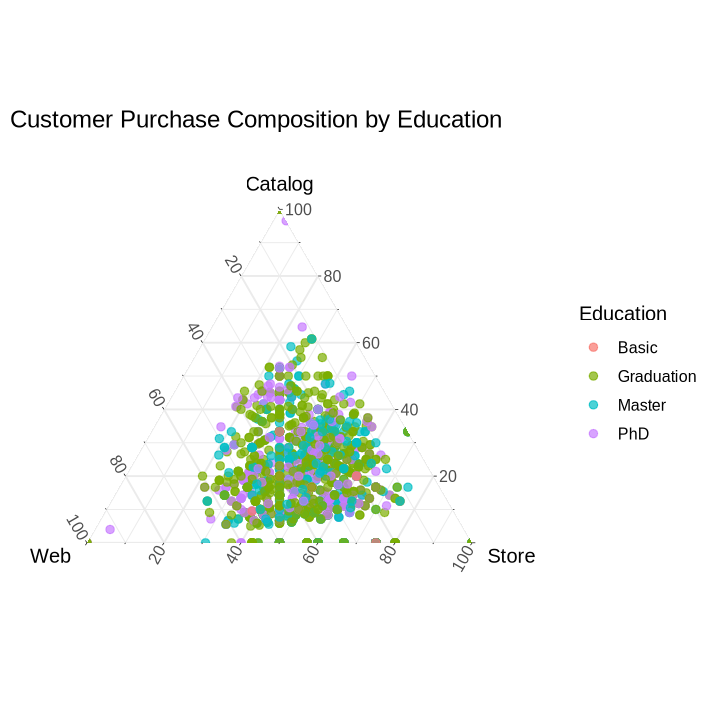

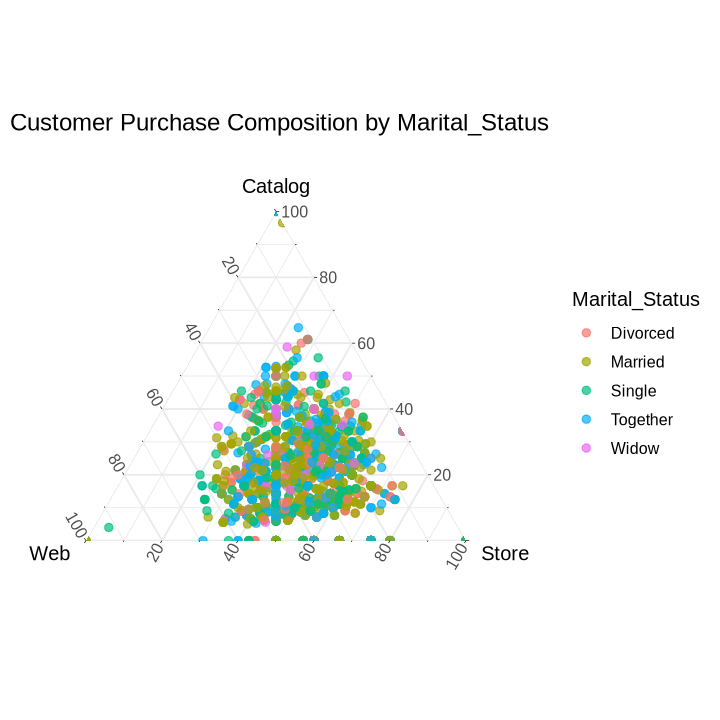

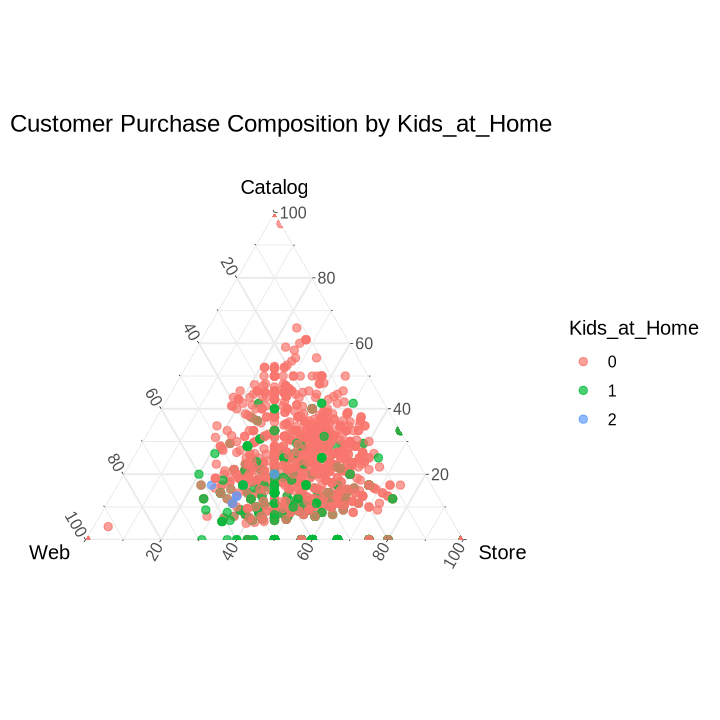

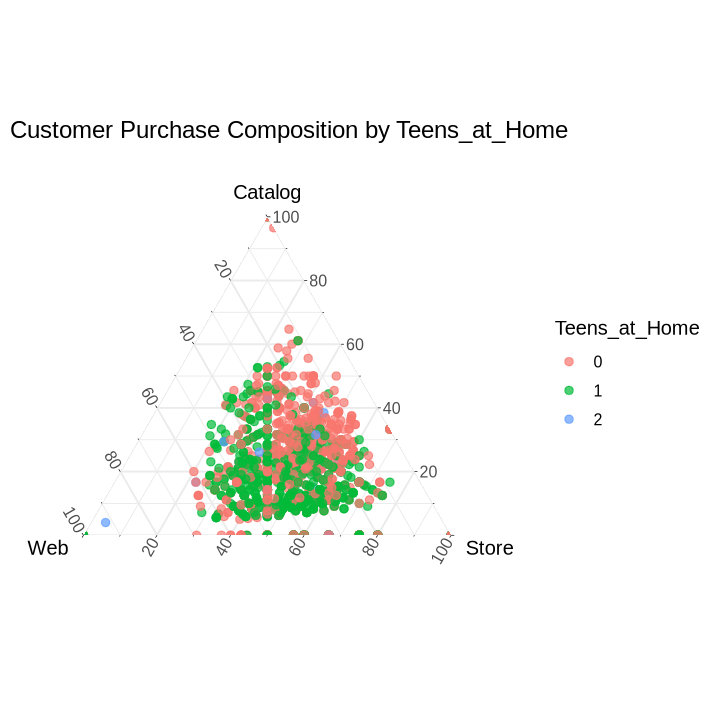

In [10]:
options(repr.plot.width = 6, repr.plot.height = 6)

# function to generate ternary plot with specified variable for colour channel
plot_ternary <- function(color_var){
    # ensure color_var is a factor
    df <- customers_clean %>%
        mutate(!!color_var := as.factor(.data[[color_var]]))
    
    ggtern(data = df, aes_string(x = "PropWebPurchases", y = "PropCatalogPurchases", z = "PropStorePurchases", color = color_var)) +
        geom_point(size = 2, alpha = 0.7) +
        theme_minimal() +
        labs(
          title = paste("Customer Purchase Composition by", color_var),
          x = "Web",
          y = "Catalog",
          z = "Store",
          color = color_var
        ) +
        theme_showgrid()
}

vars_to_plot <- c("Education", "Marital_Status", "Kids_at_Home", "Teens_at_Home")

ternary_plot_list <- list()

# add ternary plot to ternary_plot_list
for (v in vars_to_plot) {
    p <- plot_ternary(v)
    print(p)
    ternary_plot_list[[v]] <- p
}

## Correlation Plot

- <mark>Labelled each cell with its corresponding correlation value.</mark>

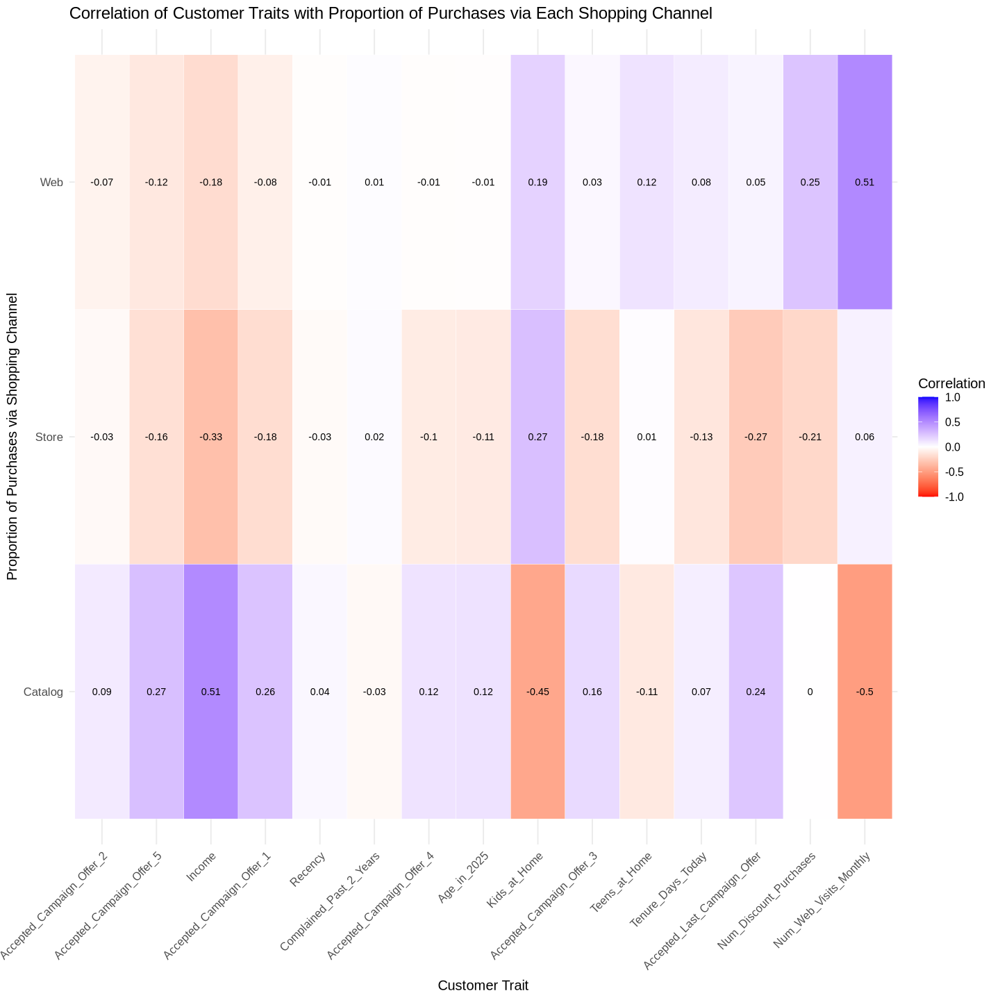

In [11]:
options(repr.plot.width = 12, repr.plot.height = 12)

# keep only numeric variables
customers_numeric <- customers_clean %>%
  # keep numeric and integer columns
  select(where(is.numeric)) %>% 
  # remove irrelevant columns
  select(-Year_Birth, -TotalPurchases)
  
# create correlation matrices for each shopping channel
corr_web <- cor(customers_numeric, customers_numeric$PropWebPurchases, use = "complete.obs")
corr_catalog <- cor(customers_numeric, customers_numeric$PropCatalogPurchases, use = "complete.obs")
corr_store <- cor(customers_numeric, customers_numeric$PropStorePurchases, use = "complete.obs")

# combine correlations into df
corr_df <- data.frame(
  Variable = rownames(corr_web),
  Web = corr_web,
  Catalog = corr_catalog,
  Store = corr_store
)

# remove the channels themselves from the list
corr_df <- corr_df %>% filter(!Variable %in% c("NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases",
                                               "PropWebPurchases", "PropCatalogPurchases", "PropStorePurchases"))
corr_long <- corr_df %>%
  pivot_longer(cols = c(Web, Catalog, Store),
               names_to = "Channel",
               values_to = "Correlation")

corr_plot <- ggplot(corr_long, aes(y = Channel, x = reorder(Variable, Correlation), fill = Correlation)) +
  geom_tile(color = "white") +
  geom_text(aes(label = round(Correlation, 2)), size = 3) +
  scale_fill_gradient2(low = "red", mid = "white", high = "blue", limits = c(-1, 1)) +
  labs(title = "Correlation of Customer Traits with Proportion of Purchases via Each Shopping Channel",
       y = "Proportion of Purchases via Shopping Channel", x = "Customer Trait") +
  theme_minimal(base_size = 12) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1), axis.text.y = element_text(size = 10))
corr_plot

## Combining Visualizations
- Unfortunately, combining visualizations via R packages removes the grid lines for my ternary plots, so I will combine .png images of the visualizations.

In [12]:
# folder to save ternary plots
dir.create("ternary_plots", showWarnings = FALSE)
for (name in names(ternary_plot_list)) {
  ggsave(
    filename = paste0("ternary_plots/", name, ".png"), 
    plot = ternary_plot_list[[name]],
    width = 6, height = 6, dpi = 400
  )
}

# saving correlation plot
ggsave("corr_plot.png", corr_plot, width = 10, height = 6, dpi = 300)

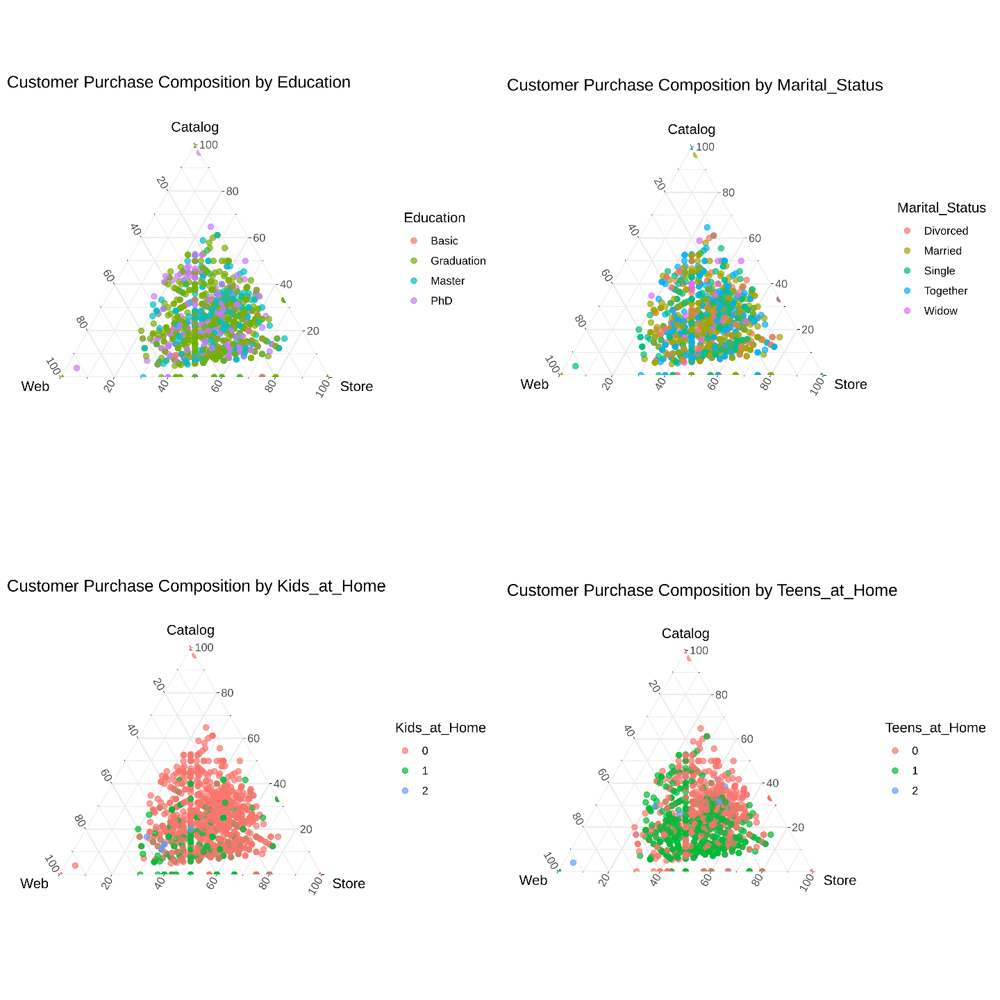

In [13]:
options(repr.plot.width = 12, repr.plot.height = 12)

# read ternary plot images
img1 <- rasterGrob(readPNG("ternary_plots/Education.png"), interpolate = TRUE)
img2 <- rasterGrob(readPNG("ternary_plots/Marital_Status.png"), interpolate = TRUE)
img3 <- rasterGrob(readPNG("ternary_plots/Kids_at_Home.png"), interpolate = TRUE)
img4 <- rasterGrob(readPNG("ternary_plots/Teens_at_Home.png"), interpolate = TRUE)

# arrange in a 2x2 grid
tern_plots <- grid.arrange(img1, img2, img3, img4, ncol = 2)
ggsave("tern_plots.png", tern_plots, width = 12, height = 12, dpi = 400)

## Final Visualization

- View `final_plots.png` for better resolution of this visualization.

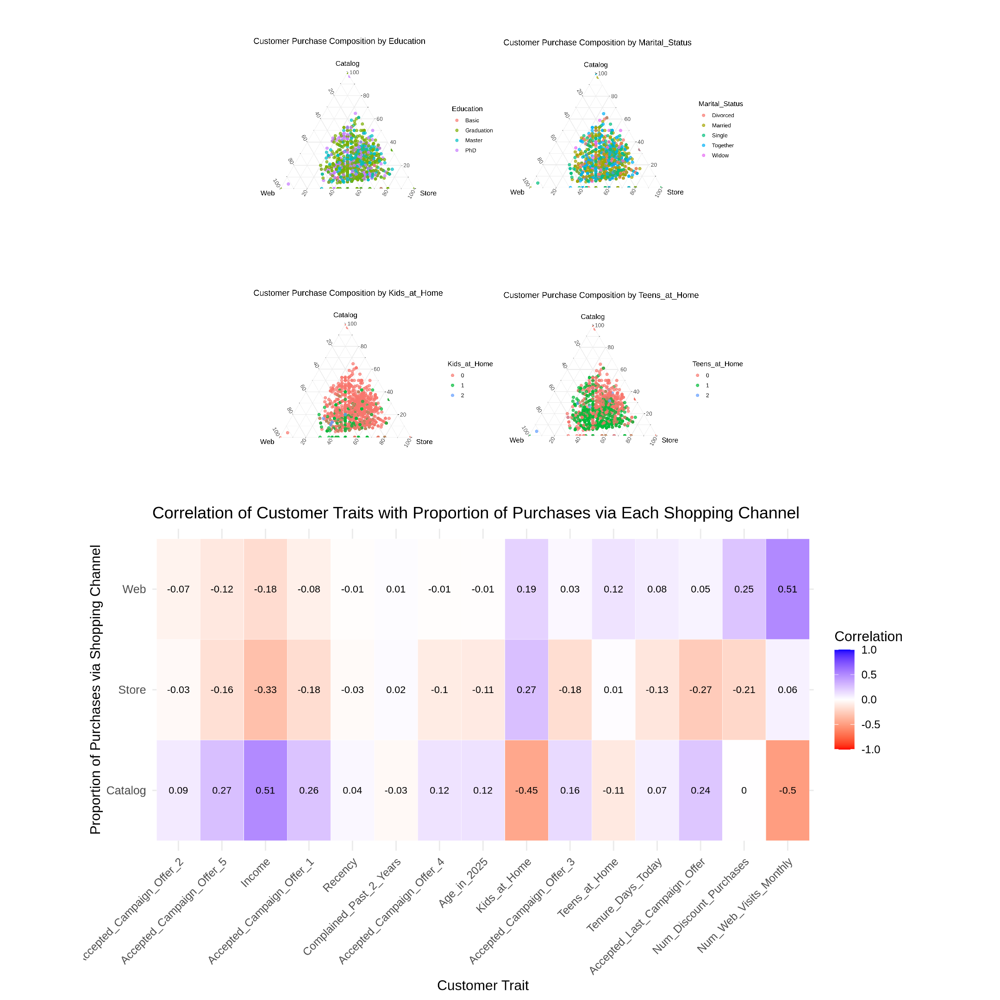

In [14]:
options(repr.plot.width = 18, repr.plot.height = 18)

img5 <- rasterGrob(readPNG("tern_plots.png"), interpolate = TRUE)
img6 <- rasterGrob(readPNG("corr_plot.png"), interpolate = TRUE)

final_plots <- grid.arrange(img5, img6, ncol = 1)
ggsave("final_plots.png", final_plots, width = 12, height = 18, dpi = 300)

## Interpretations

### Ternary Plots
- Visualizes the association between customer demographic variables and the proportion of purchases via each shopping channel: this will help me determine the strength of the associations and which variables to include in my predictive model.
- Points are not clustered in the center of the plot, showing that customers in this dataset generally bias towards making more purchases in the store and fewer purchases via the catalog.

##### Coloured by `Education`: shows the association between customer education and the proportion of purchases via each shopping channel.
- No clear trend or bias in this plot: proportions of purchases appear evenly distributed across channels by education.
##### Coloured by `Marital_Status`: shows the association between customer marital status and the proportion of purchases via each shopping channel.
- No clear trend or bias in this plot: proportions of purchases appear evenly distributed across channels by marital status.
##### Coloured by `Kids_at_Home`: shows the association between the number of kids the customer has at home and the proportion of purchases via each shopping channel.
- Customers with 1+ kids at home appear to make more web purchases (lower-left section).
##### Coloured by `Teens_at_Home`: shows the association between the number of teens the customer has at home and the proportion of purchases via each shopping channel.
- Many more customers with teens at home than kids at home.
- There is a cluster of customers with 1+ teens at home that appears to make more web purchases (lower-left section), and a group of customers with 1+ teens at home that appears to make fewer store purchases (left section).

##### Conclusion
- <mark>The number of kids/teens at home are likely to be significantly associated with and predictors of the proportion of purchases made via each shopping channel.</mark>
- <mark>There are many more customers with teens at home than kids at home, which may influence the strength of the latter predictor.</mark>
- <mark>There are very few customers that complained within the past 2 years, so this is unlikely to make a good predictor for our model.</mark>

### Correlation Plot
- Shows the correlation between numeric variables of customer traits and the proportion of purchases via each shopping channel: this will help me determine the strength of the associations and which variables to include in my predictive model.
##### `Catalog` channel:
- Proportion of catalog purchases strongly positively correlated with income, and slightly positively correlated with accepting campaign offers.
- Proportion of catalog purchases strongly negatively correlated with number of monthly web visits and kids at home.
##### `Store` channel:
- Proportion of store purchases slightly positively correlated with kids at home.
- Proportion of store purchases slightly negatively correlated with income and accepting the last campaign offer.
##### `Web` channel:
- Proportion of web purchases strongly positively correlated with number of monthly web visits, and slightly positively correlated with the number of discount purchases and kids at home.
- Proportion of web purchases slightly negatively correlated with income.

##### Conclusion
- <mark>The number of kids at home, income, monthly web visits, number of discount purchases, and acceptance of campaign offers are likely to be significantly associated with and predictors of the proportion of purchases made via each shopping channel.</mark> 
    - <mark>Specifically the number of kids at home, income, and monthly web visits are likely to be strong predictors.</mark> 

# 4. Method and Plan

### Model: Multinomial Logistic Regression
- Multinomial logistic regression is designed for categorical outcomes with more than two unordered categories (web, catalog, or store), making it ideal for modeling which shopping channel a customer prefers.

### Assumptions
- Independence of observations: ie. each customer is independent.
- Independence of irrelevant alternatives (IIA): the odds of preferring one shopping channel shouldn't change if we remove another channel.
- No severe multicollinearity among predictors.
- Linear relationship between predictors and the log-odds of each outcome.
- All predictors are homoscedastic.

### Limitations
- IIA is often unrealistic: shopping channel preferences *would* change if we removed another channel.
- By only considering the log-odds of preferring a shopping channel, we lose information about how many purchases the customer would make via each channel.
- Model coefficients are relative to the store reference category: I will not produce results for web vs. catalog.

# 5. Computational Code and Output

## More Wrangling
- Shaped data into long format with `Channel` and corresponding `Count` columns.
- Some numeric predictors are on vastly different scales - in order to easily compare effect sizes across predictors and optimize convergence, **I scaled numeric variables**.
    - I also tried to generate a model without scaling, and received improbable results: tiny standard errors (eg. 10^-8), huge z-values (eg. 10^7), and p-values of exactly 0 for almost every term.  
- Changed reference category to store channel.

In [15]:
# shaped data into long format with `Channel` and `Count` columns
customers_long <- customers_clean %>%
  pivot_longer(
    cols = c(NumWebPurchases, NumCatalogPurchases, NumStorePurchases),
    names_to = "Channel",
    values_to = "Count"
  ) %>%
  mutate(
    Channel = case_when(
      Channel == "NumWebPurchases" ~ "Web",
      Channel == "NumCatalogPurchases" ~ "Catalog",
      Channel == "NumStorePurchases" ~ "Store"
    ),
    Channel = factor(Channel)
  )

# scaling numeric variables
numeric_cols <- c(
  "Year_Birth", "Income", "Kids_at_Home", "Teens_at_Home",
  "Tenure_Days_Today", "Recency", "Num_Web_Visits_Monthly", "Num_Discount_Purchases"
)
customers_long[numeric_cols] <- scale(customers_long[numeric_cols])

# changing reference category
customers_long$Channel <- relevel(customers_long$Channel, ref = "Store")

## Building Model

I will start with an additive model: with 17 predictors and a 3-category outcome, I am already estimating a lot of parameters. I will consider interactions after I have reduced my model.

In [16]:
multinom_model <- multinom(
  Channel ~ Year_Birth + Education + Marital_Status + Income + Kids_at_Home + Teens_at_Home +
            Tenure_Days_Today + Recency + Num_Web_Visits_Monthly + Num_Discount_Purchases + Complained_Past_2_Years +
            Accepted_Campaign_Offer_1 + Accepted_Campaign_Offer_2 + Accepted_Campaign_Offer_3 + Accepted_Campaign_Offer_4 +
            Accepted_Campaign_Offer_5 + Accepted_Last_Campaign_Offer,
  data = customers_long,
  weights = Count,
  na.action = na.exclude
)

# weights:  72 (46 variable)
initial  value 30501.871583 
iter  10 value 28622.144543
iter  20 value 28593.365032
iter  30 value 28342.354729
iter  40 value 28281.066403
iter  50 value 28237.776009
final  value 28237.735995 
converged


## Results

In [17]:
summary_model <- summary(multinom_model)

coefs <- summary_model$coefficients
se    <- summary_model$standard.errors

# calculate z and p values
z <- coefs / se
p <- 2 * (1 - pnorm(abs(z)))

# calculate 95% CI
lower_ci <- coefs - 1.96 * se
upper_ci <- coefs + 1.96 * se

# exponentiate log-odds to odds
odds_ratio      <- exp(coefs)
odds_lower_95   <- exp(lower_ci)
odds_upper_95   <- exp(upper_ci)

results <- data.frame(
  Outcome     = rep(rownames(coefs), each = ncol(coefs)),
  Predictor   = rep(colnames(coefs), times = nrow(coefs)),
  Coefficient = as.vector(coefs),
  Std_Error   = as.vector(se),
  z           = as.vector(z),
  p           = as.vector(p),
  Odds_Ratio  = as.vector(odds_ratio),
  OR_Lower_95 = as.vector(odds_lower_95),
  OR_Upper_95 = as.vector(odds_upper_95)
)

results_sorted <- results %>% arrange(Outcome, p)
results_sorted

Outcome,Predictor,Coefficient,Std_Error,z,p,Odds_Ratio,OR_Lower_95,OR_Upper_95
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Catalog,Accepted_Campaign_Offer_2,0.2974134232,0.03056683,9.72994020,0.000000e+00,1.3463718,1.2680781,1.4294995
Catalog,Accepted_Campaign_Offer_4,-0.2806170579,0.02774987,-10.11237441,0.000000e+00,0.7553175,0.7153332,0.7975368
Catalog,Accepted_Last_Campaign_Offer,-0.1319904709,0.02102694,-6.27720863,3.447054e-10,0.8763493,0.8409667,0.9132207
Catalog,(Intercept),-1.3917896820,0.22266965,-6.25046873,4.092227e-10,0.2486299,0.1606990,0.3846747
Catalog,Accepted_Campaign_Offer_3,0.1493288988,0.02679034,5.57398338,2.489795e-08,1.1610548,1.1016619,1.2236497
Catalog,Accepted_Campaign_Offer_5,-0.0674196365,0.01969200,-3.42370678,6.177323e-04,0.9348028,0.8994103,0.9715881
Catalog,Year_Birth,-0.4286258331,0.13888884,-3.08610699,2.027958e-03,0.6514036,0.4961644,0.8552139
Catalog,EducationGraduation,-0.0361449353,0.01675022,-2.15787817,3.093731e-02,0.9645005,0.9333497,0.9966910
Catalog,EducationMaster,-0.0263702387,0.01531569,-1.72177953,8.510946e-02,0.9739744,0.9451714,1.0036552


## Interpretation

### Choosing catalog over store shopping:

At a significance level of **alpha = 0.05**:
- Customers that are younger are 35% less likely, graduated customers (relative to basic education) are 4% less likely, customers that accepted campaign offer 2, 3, 4, 5, and the last offer are 35% more likely, 16% more likely, 25% less likely, 7% less likely, and 12% less likely, respectively, to choose catalog over store shopping.

### Choosing web over store shopping:
At a significance level of **alpha = 0.001** (reporting most significant predictors):
- Customers that are single were 39% more likely, common-law are 23% more likely, married are 19% less likely, younger are 7% more likely, customers with more discount purchases are 71% more likely, customers with more web visits are 32% less likely, customers with a Master's are 5% more likely, and graduated customers are 6% less likely to choose web over store shopping.
- Customers that accepted campaign offer 5 and the last offer are 30% and 21% more likely, respectively, to choose web over store shopping.

### Summary
- It appears that a preference for catalog shopping is associated with customers that are older and particularly sensitive to campaigns 2 (positive), 3 (positive), and 4 (negative).
- Preference for shopping on the web is associated with customers that are younger, not married, and make more discount purchases (deal-seekers).
- Unexpectedly, more monthly web visits are associated with lowers odds of preferring web shopping - these customers may be browsing but not buying over the web.